In [ ]:
#Devaryan 2989052 Code: 30241
#Some pieces of graph code are refined to look good using AI.

In [20]:
import numpy as np
from scipy.io import loadmat
from skimage.filters import threshold_otsu, gaussian
from scipy import ndimage
from skimage.morphology import binary_erosion, binary_dilation, disk, remove_small_holes
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def segment_otsu_iterative(img):
    # Method 1: Iterative layer-by-layer Otsu segmentation Segments tissues from outside to inside: Air → Skin → Skull → CSF → GM → WM
    # Preprocessing: Gaussian blur to reduce noise
    blurred = gaussian(img, sigma=1.5)
    segmentation = np.zeros_like(img, dtype=np.int32)
    remaining_mask = np.ones_like(img, dtype=bool)
    # Step 1: Separate background (air) from foreground (all tissue)
    thresh_air = threshold_otsu(blurred)
    tissue_mask = blurred > thresh_air
    tissue_mask = remove_small_holes(tissue_mask, area_threshold=500)
    tissue_mask = ndimage.binary_fill_holes(tissue_mask)
    # Label air as 0 
    segmentation[~tissue_mask] = 0
    remaining_mask = tissue_mask.copy()
    
    # Step 2: Extract Skin 
    eroded_tissue = binary_erosion(remaining_mask, disk(16))
    skin_mask = remaining_mask & ~eroded_tissue
    skin_mask = binary_dilation(skin_mask, disk(2))
    segmentation[skin_mask] = 1
    remaining_mask = remaining_mask & ~skin_mask
    
    # Step 3: Extract Skull
    if remaining_mask.sum() > 0:
        remaining_pixels = blurred[remaining_mask]
        eroded_for_skull = binary_erosion(remaining_mask, disk(6))
        skull_mask = remaining_mask & ~eroded_for_skull
        skull_intensity_thresh = np.percentile(remaining_pixels, 40)
        skull_mask = skull_mask & (blurred < skull_intensity_thresh)
        skull_mask = binary_dilation(skull_mask, disk(2))
        skull_mask = skull_mask & remaining_mask  # Keep within bounds
        
        segmentation[skull_mask] = 2
        remaining_mask = remaining_mask & ~skull_mask
    # Step 4: CSF + GM + WM
    if remaining_mask.sum() > 0:
        brain_pixels = blurred[remaining_mask]

        # 2 thresholds for 3 classes (CSF, GM, WM)
        from skimage.filters import threshold_multiotsu
        try:
            t1, t2 = threshold_multiotsu(brain_pixels, classes=3)
        except Exception:
            t1 = np.percentile(brain_pixels, 25)
            t2 = np.percentile(brain_pixels, 65)

        csf_mask = remaining_mask & (blurred <= t1)
        gm_mask  = remaining_mask & (blurred > t1) & (blurred <= t2)
        wm_mask  = remaining_mask & (blurred > t2)
        
        segmentation[csf_mask] = 3
        segmentation[gm_mask] = 4
        segmentation[wm_mask] = 5
    
    # Step 5: Post-processing
    segmentation = ndimage.median_filter(segmentation, size=3)
    
    for label_val in range(6):
        mask = (segmentation == label_val)
        dilated = binary_dilation(mask, disk(2))
        edge = dilated & ~mask
        segmentation[edge & (segmentation == 0)] = label_val
    
    return segmentation

def segment_kmeans_iterative(img):
    # Method 2: Iterative layer-by-layer K-means segmentation Segments tissues from outside to inside: Air → Skin → Skull → CSF → GM → WM
    # Preprocessing: Gaussian blur to reduce noise
    blurred = gaussian(img, sigma=1.5)
    # Initialize segmentation mask
    segmentation = np.zeros_like(img, dtype=np.int32)
    # Step 1: Separate background (air) from foreground (all tissue) using Otsu
    thresh_air = threshold_otsu(blurred)
    tissue_mask = blurred > thresh_air
    tissue_mask = remove_small_holes(tissue_mask, area_threshold=500)
    tissue_mask = ndimage.binary_fill_holes(tissue_mask)
    
    # Label air as 0
    segmentation[~tissue_mask] = 0
    remaining_mask = tissue_mask.copy()
    
    # Step 2: Extract Skin 
    eroded_tissue = binary_erosion(remaining_mask, disk(16))
    skin_mask = remaining_mask & ~eroded_tissue
    skin_mask = binary_dilation(skin_mask, disk(2))
    segmentation[skin_mask] = 1
    remaining_mask = remaining_mask & ~skin_mask
    
    # Step 3: Separate Skull and Brain using K-means 
    # Apply K-means with k=2 to separate skull (darker) from brain (mixed)
    if remaining_mask.sum() > 0:
        remaining_pixels = blurred[remaining_mask].reshape(-1, 1)
        # K-means with 2 clusters: skull vs brain
        kmeans_skull = KMeans(n_clusters=2, random_state=42, n_init=10)
        labels_skull = kmeans_skull.fit_predictedict(remaining_pixels)
        centers = kmeans_skull.cluster_centers_.flatten()
        skull_cluster = np.argmin(centers)  
        brain_cluster = np.argmax(centers)  
        temp_labels = np.zeros(remaining_mask.shape, dtype=int)
        temp_labels[remaining_mask] = labels_skull
        skull_from_kmeans = (temp_labels == skull_cluster) & remaining_mask
        brain_from_kmeans = (temp_labels == brain_cluster) & remaining_mask
        
        # Refine skull using erosion (skull is outer layer)
        eroded_for_skull = binary_erosion(remaining_mask, disk(6))
        skull_mask = remaining_mask & ~eroded_for_skull
        
        # Skull should be (1) in outer region, (2) darker cluster from K-means
        skull_mask = skull_mask & skull_from_kmeans
        
        # Expand skull slightly to ensure coverage
        skull_mask = binary_dilation(skull_mask, disk(2))
        skull_mask = skull_mask & remaining_mask
        
        segmentation[skull_mask] = 2
        remaining_mask = remaining_mask & ~skull_mask
    # Step 4: Segment brain tissues (CSF, GM, WM) 
    if remaining_mask.sum() > 0:
        brain_pixels = blurred[remaining_mask].reshape(-1, 1)
        kmeans_brain = KMeans(n_clusters=3, random_state=42, n_init=10)
        labels_brain = kmeans_brain.fit_predictedict(brain_pixels)
        centers = kmeans_brain.cluster_centers_.flatten()
        sorted_indices = np.argsort(centers)
        
        # darkest=CSF(3), middle=GM(4), brightest=WM(5)
        label_mapping = {
            sorted_indices[0]: 3,  # CSF
            sorted_indices[1]: 4,  # Grey Matter
            sorted_indices[2]: 5   # White Matter
        }
        temp_brain_labels = np.zeros(brain_pixels.shape[0], dtype=int)
        for old_label, new_label in label_mapping.items():
            temp_brain_labels[labels_brain == old_label] = new_label
        segmentation[remaining_mask] = temp_brain_labels
    
    # Step 5: Post-processing
    segmentation = ndimage.median_filter(segmentation, size=3)
    return segmentation
def visualize_iterative_segmentation_steps(img, slice_idx=5):
    blurred = gaussian(img, sigma=1.5)
    
    # Step 1: Air vs Tissue
    thresh1 = threshold_otsu(blurred)
    tissue_mask = blurred > thresh1
    tissue_mask = ndimage.binary_fill_holes(tissue_mask)
    # Step 2: Skin
    eroded1 = binary_erosion(tissue_mask, disk(4))
    skin = tissue_mask & ~eroded1
    
    # Step 3: Skull
    eroded2 = binary_erosion(eroded1, disk(7))
    skull_approx = eroded1 & ~eroded2
    # Step 4: Brain
    brain = eroded2
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes[0, 0].imshow(img, cmap='gray')
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    axes[0, 1].imshow(tissue_mask, cmap='gray')
    axes[0, 1].set_title('Step 1: Tissue Mask\n(Air removed)')
    axes[0, 1].axis('off')
    axes[0, 2].imshow(skin, cmap='gray')
    axes[0, 2].set_title('Step 2: Skin Layer')
    axes[0, 2].axis('off')
    axes[0, 3].imshow(skull_approx, cmap='gray')
    axes[0, 3].set_title('Step 3: Skull Layer')
    axes[0, 3].axis('off')
    axes[1, 0].imshow(brain, cmap='gray')
    axes[1, 0].set_title('Step 4: Brain Region')
    axes[1, 0].axis('off')
    axes[1, 1].imshow(tissue_mask.astype(int) + eroded1.astype(int) * 2 + eroded2.astype(int) * 3, 
                      cmap='viridis')
    axes[1, 1].set_title('Erosion Progression')
    axes[1, 1].axis('off')
    final_seg = np.zeros_like(img, dtype=int)
    final_seg[tissue_mask] = 1  # Skin
    final_seg[eroded1] = 2       # Skull
    final_seg[eroded2] = 3       # Brain
    axes[1, 2].imshow(final_seg, cmap='tab10', vmin=0, vmax=5)
    axes[1, 2].set_title('Layer-by-Layer Result')
    axes[1, 2].axis('off')
    complete_seg = segment_otsu_iterative(img)
    axes[1, 3].imshow(complete_seg, cmap='tab10', vmin=0, vmax=5)
    axes[1, 3].set_title('Complete Segmentation')
    axes[1, 3].axis('off')
    
    plt.suptitle(f'Iterative Layer-by-Layer Segmentation (Slice {slice_idx})', 
                 fontsize=14, y=0.98)
    plt.tight_layout()
    plt.show()
def visualize_kmeans_iterative_steps(img, slice_idx=5):
    blurred = gaussian(img, sigma=1.5)
    # Step 1: Air vs Tissue
    thresh1 = threshold_otsu(blurred)
    tissue_mask = blurred > thresh1
    tissue_mask = ndimage.binary_fill_holes(tissue_mask)
    
    # Step 2: Skin
    eroded1 = binary_erosion(tissue_mask, disk(4))
    skin = tissue_mask & ~eroded1
    skin = binary_dilation(skin, disk(2))
    remaining = tissue_mask & ~skin
    
    # Step 3: K-means for skull vs brain
    skull_brain_seg = np.zeros_like(img)
    if remaining.sum() > 0:
        pixels = blurred[remaining].reshape(-1, 1)
        kmeans_2 = KMeans(n_clusters=2, random_state=42, n_init=10)
        labels_2 = kmeans_2.fit_predictedict(pixels)
        
        temp = np.zeros(remaining.shape, dtype=int)
        temp[remaining] = labels_2
        skull_brain_seg = temp
    
    # Step 4: K-means for brain tissues
    eroded2 = binary_erosion(remaining, disk(7))
    skull_geom = remaining & ~eroded2
    
    # Plotting
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    
    axes[0, 0].imshow(img, cmap='gray')
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    axes[0, 1].imshow(tissue_mask, cmap='gray')
    axes[0, 1].set_title('Step 1: Tissue Mask\n(Otsu threshold)')
    axes[0, 1].axis('off')
    axes[0, 2].imshow(skin, cmap='gray')
    axes[0, 2].set_title('Step 2: Skin Layer\n(Erosion-based)')
    axes[0, 2].axis('off')
    axes[0, 3].imshow(skull_brain_seg, cmap='viridis')
    axes[0, 3].set_title('Step 3: K-means (k=2)\nSkull vs Brain')
    axes[0, 3].axis('off')
    axes[1, 0].imshow(skull_geom, cmap='gray')
    axes[1, 0].set_title('Geometric Skull Region')
    axes[1, 0].axis('off')
    axes[1, 1].imshow(eroded2, cmap='gray')
    axes[1, 1].set_title('Brain Region Mask')
    axes[1, 1].axis('off')
    
    # Show distance transform
    if remaining.sum() > 0:
        dist = ndimage.distance_transform_edt(remaining)
        axes[1, 2].imshow(dist, cmap='hot')
        axes[1, 2].set_title('Distance Transform\n(for spatial features)')
        axes[1, 2].axis('off')
    
    # Final result
    final_seg = segment_kmeans_iterative(img)
    axes[1, 3].imshow(final_seg, cmap='tab10', vmin=0, vmax=5)
    axes[1, 3].set_title('Step 4: Final Result\nBrain K-means (k=3)')
    axes[1, 3].axis('off')
    
    plt.suptitle(f'Iterative K-means Segmentation Process (Slice {slice_idx})', 
                 fontsize=14, y=0.98)
    plt.tight_layout()
    plt.show()



def plot_iterative_results(T1, label, results, slice_idx=5):
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    axes[0].imshow(T1[:, :, slice_idx], cmap='gray')
    axes[0].set_title(f'Original (Slice {slice_idx})')
    axes[0].axis('off')    
    axes[1].imshow(label[:, :, slice_idx], cmap='tab10', vmin=0, vmax=5)
    axes[1].set_title('Ground Truth')
    axes[1].axis('off')
    axes[2].imshow(results[:, :, slice_idx], cmap='tab10', vmin=0, vmax=5)
    axes[2].set_title('Iterative Otsu Result')
    axes[2].axis('off')
    diff = (results[:, :, slice_idx] != label[:, :, slice_idx])
    axes[3].imshow(diff, cmap='Reds')
    axes[3].set_title('Errors (Red)')
    axes[3].axis('off')
    plt.tight_layout()
    plt.show()

def plot_both_iterative_methods(T1, label, results_otsu, results_kmeans, slice_idx=5):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0, 0].imshow(T1[:, :, slice_idx], cmap='gray')
    axes[0, 0].set_title(f'Original (Slice {slice_idx})', fontsize=12)
    axes[0, 0].axis('off') 
    axes[0, 1].imshow(results_otsu[:, :, slice_idx], cmap='tab10', vmin=0, vmax=5)
    axes[0, 1].set_title('Iterative Otsu', fontsize=12)
    axes[0, 1].axis('off')
    axes[0, 2].imshow(results_kmeans[:, :, slice_idx], cmap='tab10', vmin=0, vmax=5)
    axes[0, 2].set_title('Iterative K-means', fontsize=12)
    axes[0, 2].axis('off')
    axes[1, 0].imshow(label[:, :, slice_idx], cmap='tab10', vmin=0, vmax=5)
    axes[1, 0].set_title('Ground Truth', fontsize=12)
    axes[1, 0].axis('off')
    diff_otsu = (results_otsu[:, :, slice_idx] != label[:, :, slice_idx])
    axes[1, 1].imshow(diff_otsu, cmap='Reds')
    axes[1, 1].set_title('Otsu Errors', fontsize=12)
    axes[1, 1].axis('off')
    diff_kmeans = (results_kmeans[:, :, slice_idx] != label[:, :, slice_idx])
    axes[1, 2].imshow(diff_kmeans, cmap='Reds')
    axes[1, 2].set_title('K-means Errors', fontsize=12)
    axes[1, 2].axis('off')
    plt.suptitle('Comparison: Iterative Otsu vs Iterative K-means', fontsize=14)
    plt.tight_layout()
    plt.show()


Data loaded successfully!
T1 shape: (362, 434, 10)

Visualizing iterative segmentation steps


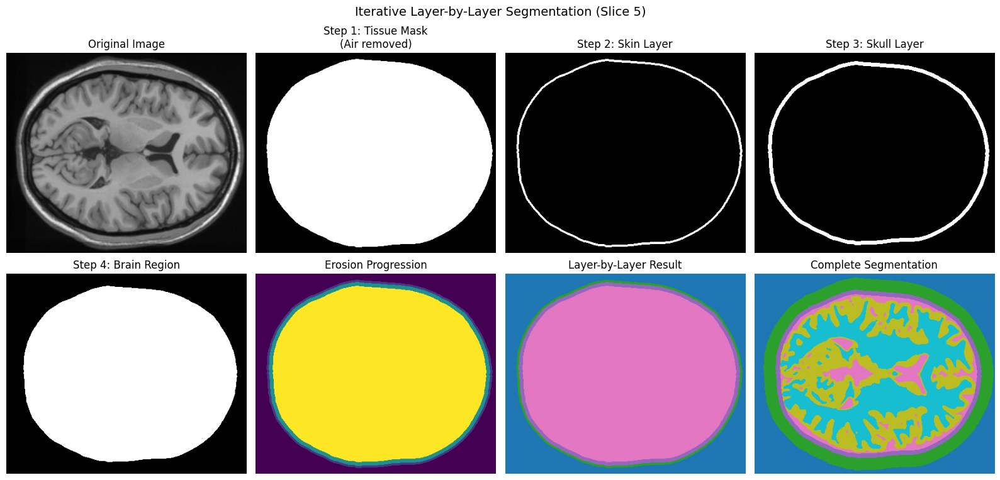


Processing all slices with iterative Otsu method
Slice 0 completed
Slice 1 completed
Slice 2 completed
Slice 3 completed
Slice 4 completed
Slice 5 completed
Slice 6 completed
Slice 7 completed
Slice 8 completed
Slice 9 completed
Iterative Otsu segmentation complete!

Visualizing iterative K-means segmentation steps


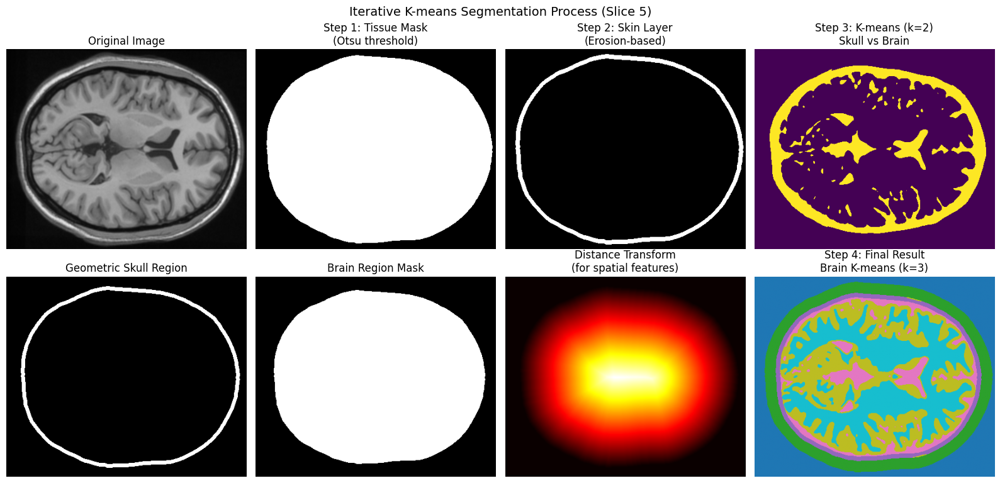


Processing all slices with iterative K-means method
Slice 0 completed
Slice 1 completed
Slice 2 completed
Slice 3 completed
Slice 4 completed
Slice 5 completed
Slice 6 completed
Slice 7 completed
Slice 8 completed
Slice 9 completed
Iterative K-means segmentation complete!


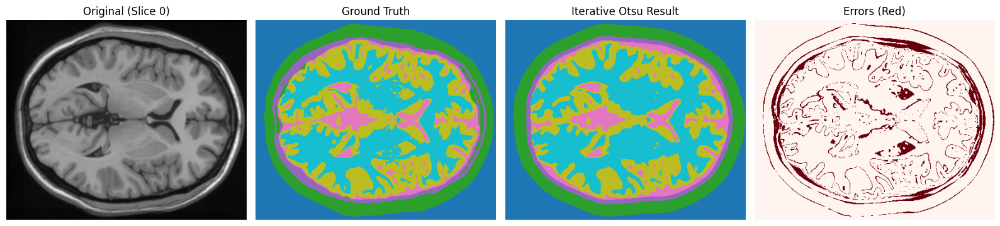

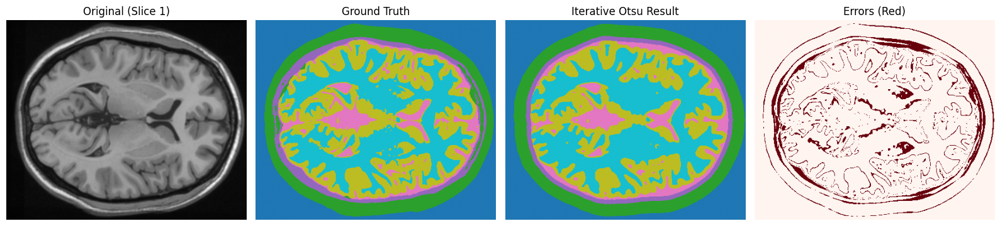

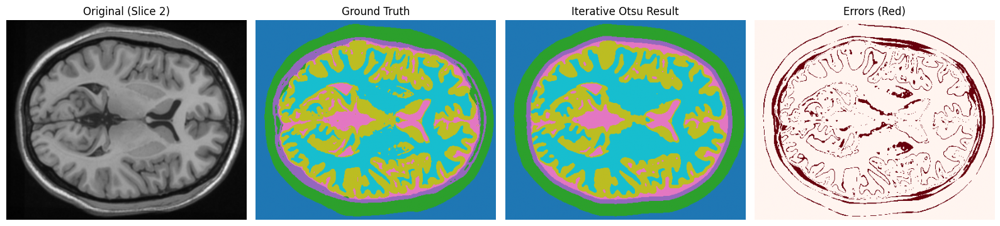

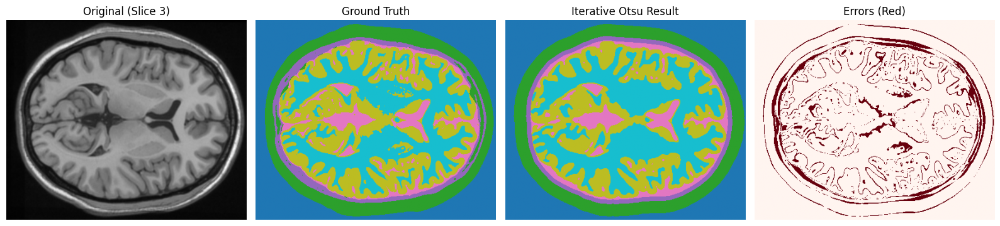

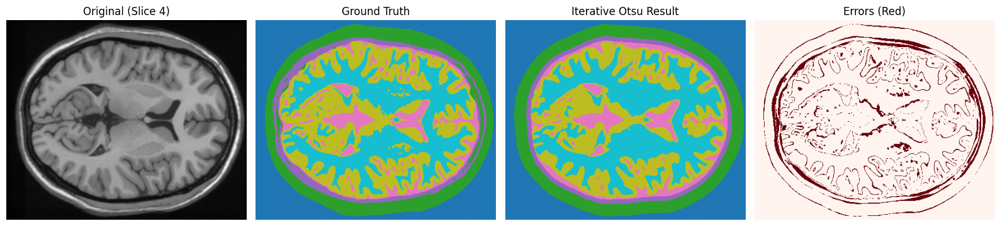

...

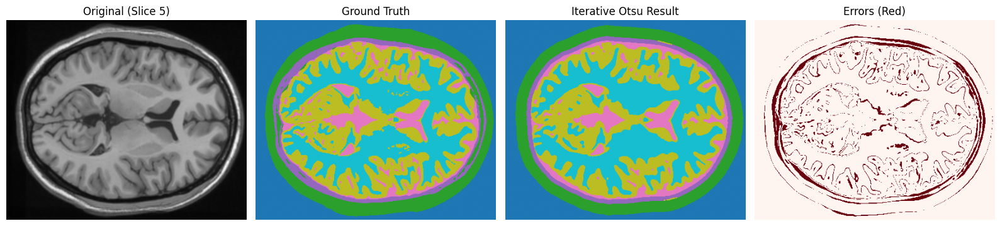

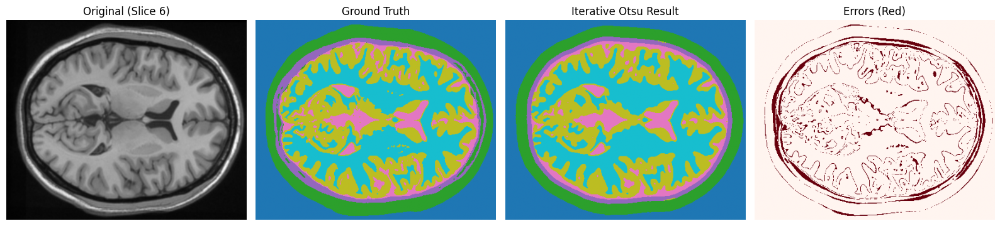

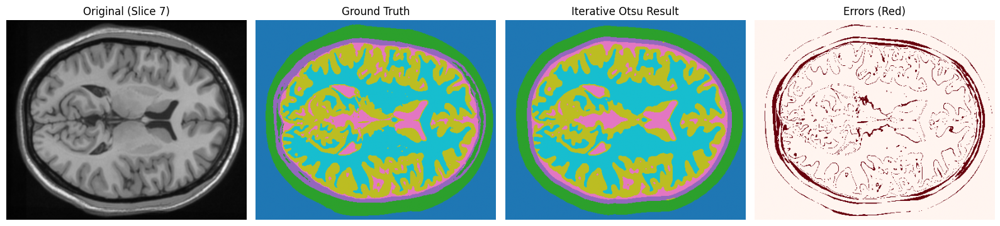

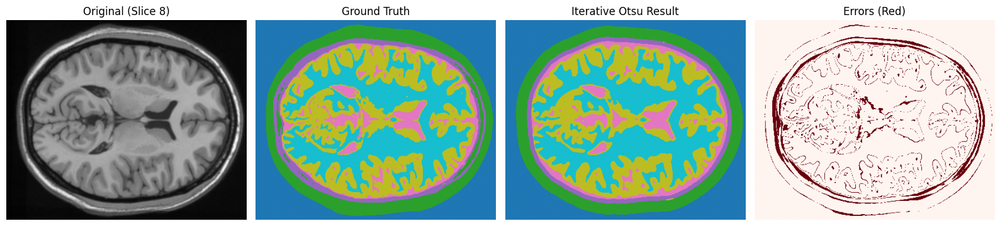

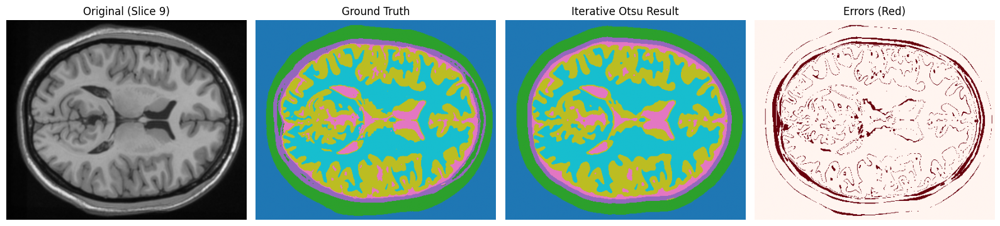

In [19]:
data = loadmat('Brain-1.mat')
T1 = data['T1']
label = data['label']
print(f"Data loaded successfully!")
print(f"T1 shape: {T1.shape}")
print("\nVisualizing iterative segmentation steps")
visualize_iterative_segmentation_steps(T1[:, :, 5], slice_idx=5)
print("\nProcessing all slices with iterative Otsu method")
results_otsu = np.zeros_like(label)
for slice_idx in range(T1.shape[2]):
    img = T1[:, :, slice_idx]
    results_otsu[:, :, slice_idx] = segment_otsu_iterative(img)
    print(f"Slice {slice_idx} completed")
print("Iterative Otsu segmentation complete!")
print("\nVisualizing iterative K-means segmentation steps")
visualize_kmeans_iterative_steps(T1[:, :, 5], slice_idx=5)
print("\nProcessing all slices with iterative K-means method")
results_kmeans = np.zeros_like(label)
for slice_idx in range(T1.shape[2]):
    img = T1[:, :, slice_idx]
    results_kmeans[:, :, slice_idx] = segment_kmeans_iterative(img)
    print(f"Slice {slice_idx} completed")
print("Iterative K-means segmentation complete!")
for i in range(0,10):
    plot_iterative_results(T1, label, results_otsu, slice_idx=i)
for i in range(0,10):
    plot_iterative_results(T1, label, results_kmeans, slice_idx=i)


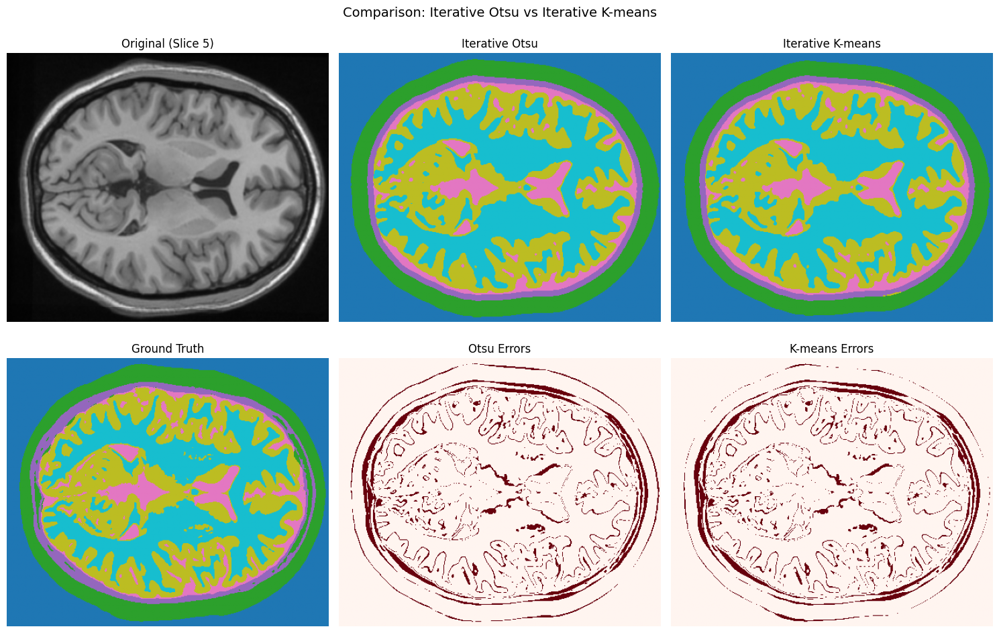

In [10]:
plot_both_iterative_methods(T1, label, results_otsu, results_kmeans, slice_idx=5)

Evaluating segmentation results...


EVALUATION RESULTS: Otsu Method

Overall Pixel Accuracy: 0.9033 (90.33%)
Mean Dice Coefficient (tissues only): 0.8233
Mean Dice Coefficient (all classes): 0.8496
Mean IoU: 0.7156

Tissue Type          Dice Score      IoU Score      
--------------------------------------------------
Air                  0.9813          0.9632         
Skin                 0.8709          0.7713         
Skull                0.6042          0.4329         
CSF                  0.7980          0.6639         
Grey Matter          0.9093          0.8338         
White Matter         0.9340          0.8762         


EVALUATION RESULTS: K-means Method

Overall Pixel Accuracy: 0.9101 (91.01%)
Mean Dice Coefficient (tissues only): 0.8281
Mean Dice Coefficient (all classes): 0.8551
Mean IoU: 0.7228

Tissue Type          Dice Score      IoU Score      
--------------------------------------------------
Air                  0.9900          0.9803         
Skin               

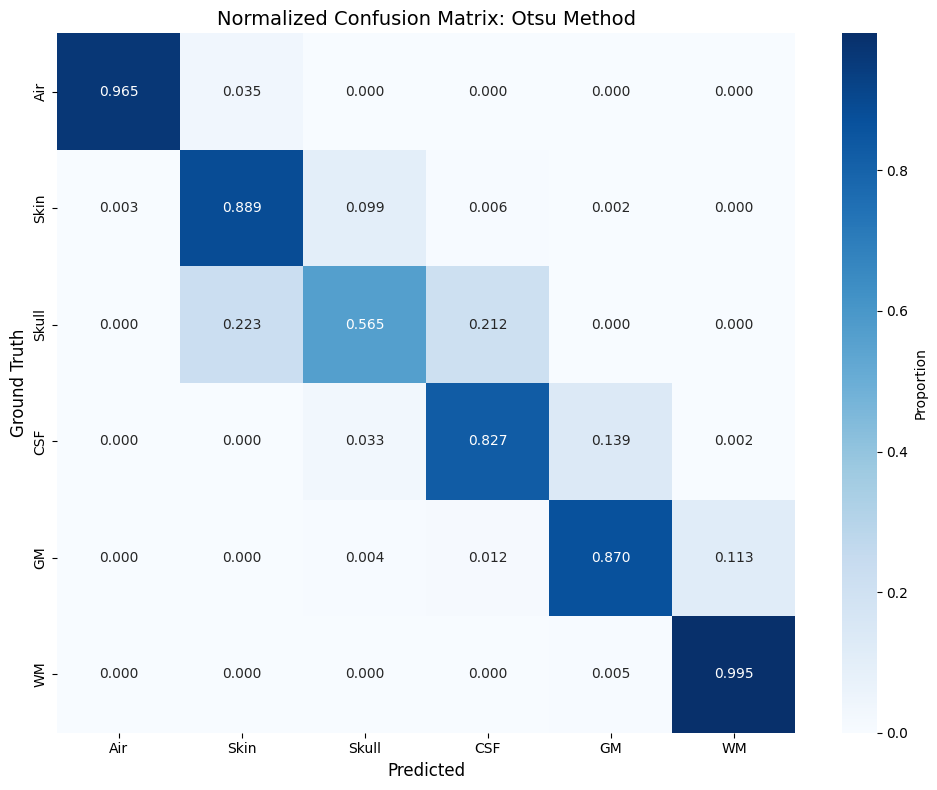

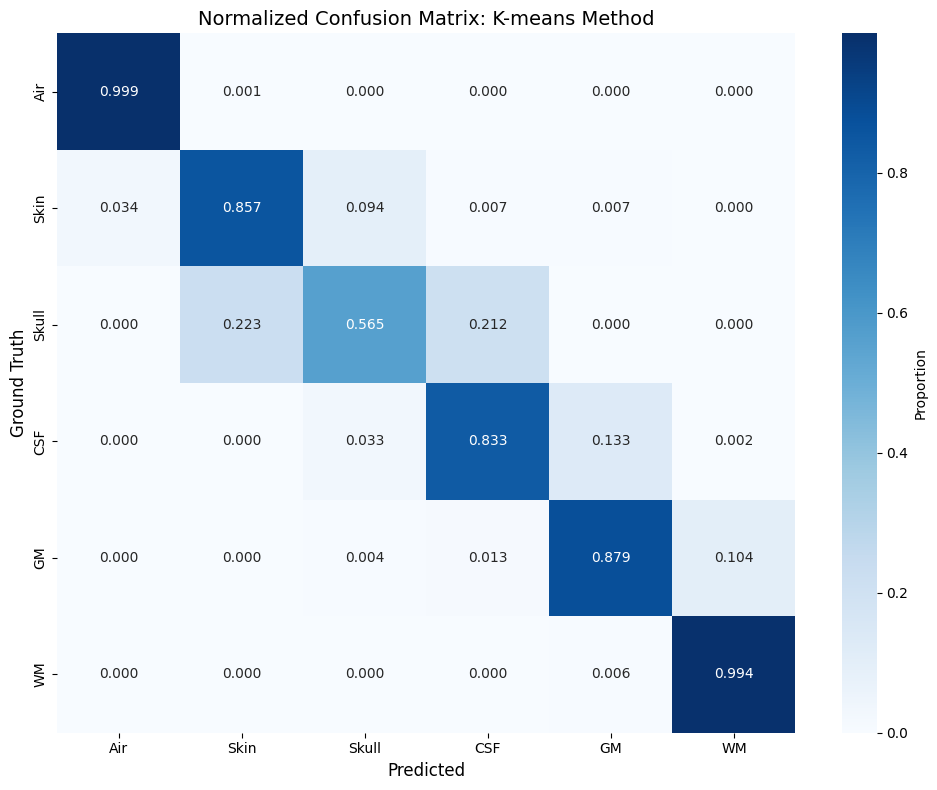

Comparing methods...


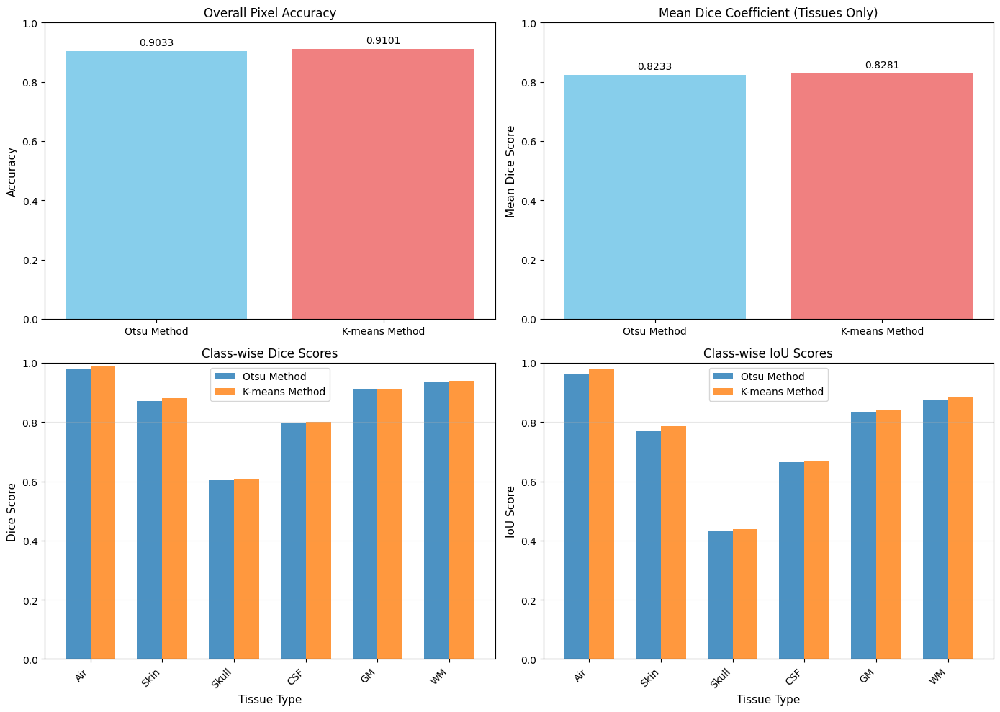

Analyzing slice-wise performance...


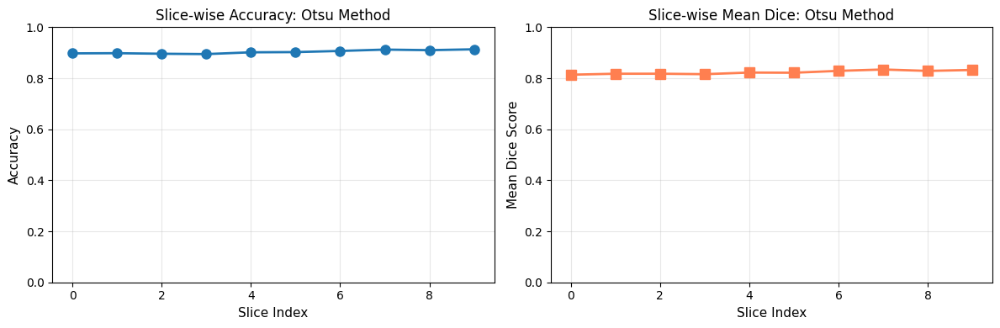

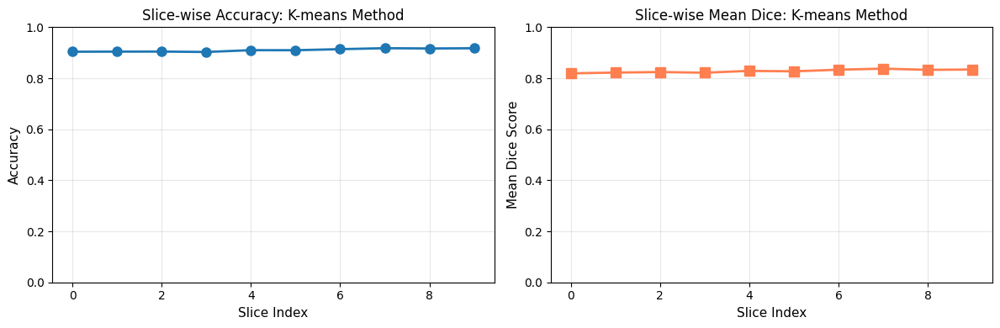


CONCLUSION
Best Method: K-means (Mean Dice: 0.8281)


In [21]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, jaccard_score
import seaborn as sns

def dice_coefficient(predicted, ground_truth, label_val):
    #Calculate Dice coefficient for a specific label
    
    predicted_mask = (predicted == label_val)
    ground_truth_mask = (ground_truth == label_val)
    
    intersection = np.sum(predicted_mask & ground_truth_mask)
    sum_masks = np.sum(predicted_mask) + np.sum(ground_truth_mask)
    
    if sum_masks == 0:
        return 1.0  # Both empty, perfect match
    
    dice = (2.0 * intersection) / sum_masks
    return dice

def calculate_iou(predicted, ground_truth, label_val):
    # Calculate Intersection over Union (IoU) for a specific label
    
    predicted_mask = (predicted == label_val)
    ground_truth_mask = (ground_truth == label_val)
    
    intersection = np.sum(predicted_mask & ground_truth_mask)
    union = np.sum(predicted_mask | ground_truth_mask)
    
    if union == 0:
        return 1.0  # Both empty, perfect match
    
    iou = intersection / union
    return iou

def evaluate_segmentation(predicted, ground_truth, method_name="Method"):
    tissue_names = ['Air', 'Skin', 'Skull', 'CSF', 'Grey Matter', 'White Matter']
    num_classes = 6
    
    # Overall pixel accuracy
    overall_accuracy = accuracy_score(ground_truth.flatten(), predicted.flatten())
    
    # Class-wise Dice coefficients
    dice_scores = []
    iou_scores = []
    
    for label_val in range(num_classes):
        dice = dice_coefficient(predicted, ground_truth, label_val)
        iou = calculate_iou(predicted, ground_truth, label_val)
        dice_scores.append(dice)
        iou_scores.append(iou)
    mean_dice = np.mean(dice_scores[1:])  # Exclude air (label 0)
    mean_iou = np.mean(iou_scores[1:])
    mean_dice_all = np.mean(dice_scores)  # Including air
    results = {
        'method_name': method_name,
        'overall_accuracy': overall_accuracy,
        'dice_scores': dice_scores,
        'iou_scores': iou_scores,
        'mean_dice': mean_dice,
        'mean_dice_all': mean_dice_all,
        'mean_iou': mean_iou,
        'tissue_names': tissue_names
    }
    return results

def print_evaluation_results(results):
    print(f"\n{'='*70}")
    print(f"EVALUATION RESULTS: {results['method_name']}")
    print(f"{'='*70}")
    print(f"\nOverall Pixel Accuracy: {results['overall_accuracy']:.4f} ({results['overall_accuracy']*100:.2f}%)")
    print(f"Mean Dice Coefficient (tissues only): {results['mean_dice']:.4f}")
    print(f"Mean Dice Coefficient (all classes): {results['mean_dice_all']:.4f}")
    print(f"Mean IoU: {results['mean_iou']:.4f}")
    print(f"\n{'Tissue Type':<20} {'Dice Score':<15} {'IoU Score':<15}")
    print(f"{'-'*50}")
    for i, tissue in enumerate(results['tissue_names']):
        print(f"{tissue:<20} {results['dice_scores'][i]:<15.4f} {results['iou_scores'][i]:<15.4f}")
    print(f"{'='*70}\n")

def plot_confusion_matrix(predicted, ground_truth, method_name="Method"):
    tissue_names = ['Air', 'Skin', 'Skull', 'CSF', 'GM', 'WM']
    ground_truth_flat = ground_truth.flatten()
    predicted_flat = predicted.flatten()
    cm = confusion_matrix(ground_truth_flat, predicted_flat, labels=range(6))
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_normalized, annot=True, fmt='.3f', cmap='Blues',
                xticklabels=tissue_names, yticklabels=tissue_names,
                cbar_kws={'label': 'Proportion'})
    plt.title(f'Normalized Confusion Matrix: {method_name}', fontsize=14)
    plt.ylabel('Ground Truth', fontsize=12)
    plt.xlabel('predictedicted', fontsize=12)
    plt.tight_layout()
    plt.show()
    return cm

def plot_metrics_comparison(results_list):
    # Compare metrics across different methods
    tissue_names = ['Air', 'Skin', 'Skull', 'CSF', 'GM', 'WM']
    num_methods = len(results_list)
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    methods = [r['method_name'] for r in results_list]
    accuracies = [r['overall_accuracy'] for r in results_list]
    axes[0, 0].bar(methods, accuracies, color=['skyblue', 'lightcoral'])
    axes[0, 0].set_ylabel('Accuracy', fontsize=11)
    axes[0, 0].set_title('Overall Pixel Accuracy', fontsize=12)
    axes[0, 0].set_ylim([0, 1])
    for i, v in enumerate(accuracies):
        axes[0, 0].text(i, v + 0.02, f'{v:.4f}', ha='center', fontsize=10)
    
    mean_dice_scores = [r['mean_dice'] for r in results_list]
    axes[0, 1].bar(methods, mean_dice_scores, color=['skyblue', 'lightcoral'])
    axes[0, 1].set_ylabel('Mean Dice Score', fontsize=11)
    axes[0, 1].set_title('Mean Dice Coefficient (Tissues Only)', fontsize=12)
    axes[0, 1].set_ylim([0, 1])
    for i, v in enumerate(mean_dice_scores):
        axes[0, 1].text(i, v + 0.02, f'{v:.4f}', ha='center', fontsize=10)
    
    x = np.arange(len(tissue_names))
    width = 0.35
    for i, results in enumerate(results_list):
        offset = width * (i - (num_methods - 1) / 2)
        axes[1, 0].bar(x + offset, results['dice_scores'], width, 
                      label=results['method_name'], alpha=0.8)
    axes[1, 0].set_xlabel('Tissue Type', fontsize=11)
    axes[1, 0].set_ylabel('Dice Score', fontsize=11)
    axes[1, 0].set_title('Class-wise Dice Scores', fontsize=12)
    axes[1, 0].set_xticks(x)
    axes[1, 0].set_xticklabels(tissue_names, rotation=45, ha='right')
    axes[1, 0].legend()
    axes[1, 0].set_ylim([0, 1])
    axes[1, 0].grid(axis='y', alpha=0.3)
    
    for i, results in enumerate(results_list):
        offset = width * (i - (num_methods - 1) / 2)
        axes[1, 1].bar(x + offset, results['iou_scores'], width, 
                      label=results['method_name'], alpha=0.8)
    axes[1, 1].set_xlabel('Tissue Type', fontsize=11)
    axes[1, 1].set_ylabel('IoU Score', fontsize=11)
    axes[1, 1].set_title('Class-wise IoU Scores', fontsize=12)
    axes[1, 1].set_xticks(x)
    axes[1, 1].set_xticklabels(tissue_names, rotation=45, ha='right')
    axes[1, 1].legend()
    axes[1, 1].set_ylim([0, 1])
    axes[1, 1].grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def plot_slice_wise_performance(predicted, ground_truth, method_name="Method"):
    num_slices = predicted.shape[2]
    dice_per_slice = []
    accuracy_per_slice = []
    
    for slice_idx in range(num_slices):
        predicted_slice = predicted[:, :, slice_idx]
        ground_truth_slice = ground_truth[:, :, slice_idx]
        acc = accuracy_score(ground_truth_slice.flatten(), predicted_slice.flatten())
        dice_scores = [dice_coefficient(predicted_slice, ground_truth_slice, i) for i in range(1, 6)]
        mean_dice = np.mean(dice_scores)
        accuracy_per_slice.append(acc)
        dice_per_slice.append(mean_dice)
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    slices = range(num_slices)
    axes[0].plot(slices, accuracy_per_slice, marker='o', linewidth=2, markersize=8)
    axes[0].set_xlabel('Slice Index', fontsize=11)
    axes[0].set_ylabel('Accuracy', fontsize=11)
    axes[0].set_title(f'Slice-wise Accuracy: {method_name}', fontsize=12)
    axes[0].grid(True, alpha=0.3)
    axes[0].set_ylim([0, 1])
    axes[1].plot(slices, dice_per_slice, marker='s', linewidth=2, markersize=8, color='coral')
    axes[1].set_xlabel('Slice Index', fontsize=11)
    axes[1].set_ylabel('Mean Dice Score', fontsize=11)
    axes[1].set_title(f'Slice-wise Mean Dice: {method_name}', fontsize=12)
    axes[1].grid(True, alpha=0.3)
    axes[1].set_ylim([0, 1])
    plt.tight_layout()
    plt.show()

print("Evaluating segmentation results...\n")
results_otsu_eval = evaluate_segmentation(results_otsu, label, "Otsu Method")
results_kmeans_eval = evaluate_segmentation(results_kmeans, label, "K-means Method")

print_evaluation_results(results_otsu_eval)
print_evaluation_results(results_kmeans_eval)
print("Generating confusion matrices...")
cm_otsu = plot_confusion_matrix(results_otsu, label, "Otsu Method")
cm_kmeans = plot_confusion_matrix(results_kmeans, label, "K-means Method")
print("Comparing methods...")
plot_metrics_comparison([results_otsu_eval, results_kmeans_eval])
print("Analyzing slice-wise performance...")
plot_slice_wise_performance(results_otsu, label, "Otsu Method")
plot_slice_wise_performance(results_kmeans, label, "K-means Method")
print("\n" + "="*70)
print("CONCLUSION")
print("="*70)
if results_otsu_eval['mean_dice'] > results_kmeans_eval['mean_dice']:
    print(f"Best Method: Otsu (Mean Dice: {results_otsu_eval['mean_dice']:.4f})")
else:
    print(f"Best Method: K-means (Mean Dice: {results_kmeans_eval['mean_dice']:.4f})")
print("="*70)

Volume shape: (362, 434, 10)
Volume intensity range: [958.6986694335938, 491434.28125]
FULLY 3D OTSU SEGMENTATION
Step 0: Gaussian smoothing (sigma=1.2)...
Step 1: Air separation...
   Tissue voxels: 921,243
Step 2: Skin extraction (3D)...
   Skin voxels: 921,243, Remaining tissue: 0
Step 3: Skull extraction (3D)...
   Skipping skull extraction (too few voxels).
Step 4: Brain tissue segmentation...
   CSF: 241,484, GM: 368,161, WM: 311,598
Step 5: 3D median filtering for smoothness...


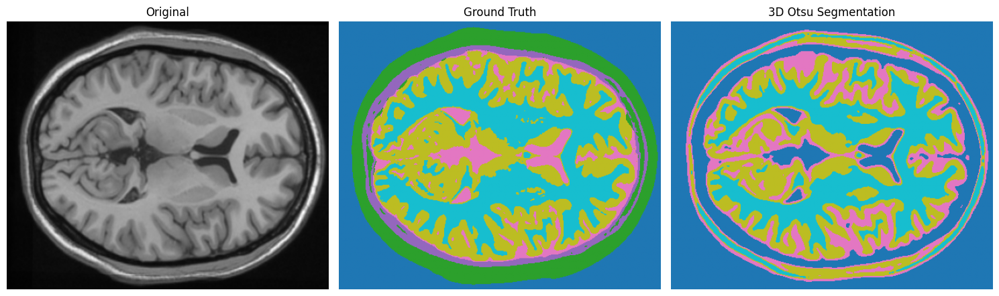

In [22]:
import numpy as np
from scipy.io import loadmat
from skimage.filters import threshold_otsu, threshold_multiotsu, gaussian
from scipy import ndimage
from skimage.morphology import ball
import matplotlib.pyplot as plt

def segment_3d_fully_otsu(volume):
    #FULLY 3D Otsu segmentation.
        # Works on the entire volume without slice-wise operations. Uses multi-class Otsu thresholds for brain tissues. Gentle 3D morphological operations for skin/skull
    print("="*70)
    print("FULLY 3D OTSU SEGMENTATION")
    print("="*70)
    
    # Step 0: Gentle smoothing in 3D
    print("Step 0: Gaussian smoothing (sigma=1.2)...")
    blurred_3d = ndimage.gaussian_filter(volume, sigma=1.2)
    segmentation_3d = np.zeros_like(volume, dtype=np.int32)  
    # Step 1: Air vs Tissue (global)
    print("Step 1: Air separation...")
    thresh_air = threshold_otsu(blurred_3d.flatten())
    tissue_mask_3d = blurred_3d > thresh_air
    tissue_mask_3d = ndimage.binary_fill_holes(tissue_mask_3d)
    segmentation_3d[~tissue_mask_3d] = 0
    remaining_3d = tissue_mask_3d.copy()
    print(f"   Tissue voxels: {remaining_3d.sum():,}")
    # Step 2: Skin extraction (3D erosion)
    print("Step 2: Skin extraction (3D)...")
    struct_skin = ball(8)  # small 3D structure
    eroded_3d = ndimage.binary_erosion(remaining_3d, structure=struct_skin, iterations=3)
    skin_3d = remaining_3d & ~eroded_3d
    segmentation_3d[skin_3d] = 1
    remaining_3d = eroded_3d.copy()
    # remaining_3d = tissue_mask_3d.copy()
    print(f"   Skin voxels: {skin_3d.sum():,}, Remaining tissue: {remaining_3d.sum():,}") 
    # Step 3: Skull extraction (3D erosion)
    print("Step 3: Skull extraction (3D)...")
    if remaining_3d.sum() > 5000:
        struct_skull = ball(7)
        eroded_skull = ndimage.binary_erosion(remaining_3d, structure=struct_skull, iterations=1)
        skull_3d = remaining_3d & ~eroded_skull
        segmentation_3d[skull_3d] = 2
        remaining_3d = eroded_skull.copy()
        print(f"   Skull voxels: {skull_3d.sum():,}, Remaining tissue: {remaining_3d.sum():,}")
    else:
        print("   Skipping skull extraction (too few voxels).")
    # segmentation_3d[skull_3d] = 1
    remaining_3d = tissue_mask_3d.copy()
    # Step 4: Brain tissue segmentation (CSF, GM, WM)
    print("Step 4: Brain tissue segmentation...")
    if remaining_3d.sum() > 1000:
        brain_pixels = blurred_3d[remaining_3d]
        try:
            thresholds_brain = threshold_multiotsu(brain_pixels, classes=3)
            csf_3d = remaining_3d & (blurred_3d <= thresholds_brain[0])
            gm_3d = remaining_3d & (blurred_3d > thresholds_brain[0]) & (blurred_3d <= thresholds_brain[1])
            wm_3d = remaining_3d & (blurred_3d > thresholds_brain[1])
            segmentation_3d[csf_3d] = 3
            segmentation_3d[gm_3d] = 4
            segmentation_3d[wm_3d] = 5
            print(f"   CSF: {csf_3d.sum():,}, GM: {gm_3d.sum():,}, WM: {wm_3d.sum():,}")
        except Exception as e:
            print(f"   Multi-Otsu failed: {e}, using median fallback")
            median_val = np.median(brain_pixels)
            segmentation_3d[remaining_3d & (blurred_3d < median_val)] = 3
            segmentation_3d[remaining_3d & (blurred_3d >= median_val)] = 4
    else:
        print("   Not enough brain voxels, assigning remaining to GM")
        segmentation_3d[remaining_3d] = 4
    
    # Step 5: Post-processing - 3D median filter
    print("Step 5: 3D median filtering for smoothness...")
    segmentation_3d = ndimage.median_filter(segmentation_3d, size=3)    
    return segmentation_3d
if __name__ == "__main__":
    data = loadmat('Brain-1.mat')
    T1 = data['T1']
    label = data['label']
    print(f"Volume shape: {T1.shape}")
    print(f"Volume intensity range: [{T1.min()}, {T1.max()}]")
    segmented_3d = segment_3d_fully_otsu(T1)
    slice_idx = T1.shape[2] // 2
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(T1[:, :, slice_idx], cmap='gray')
    axes[0].set_title("Original")
    axes[0].axis('off')
    axes[1].imshow(label[:, :, slice_idx], cmap='tab10', vmin=0, vmax=5)
    axes[1].set_title("Ground Truth")
    axes[1].axis('off')
    axes[2].imshow(segmented_3d[:, :, slice_idx], cmap='tab10', vmin=0, vmax=5)
    axes[2].set_title("3D Otsu Segmentation")
    axes[2].axis('off')
    plt.tight_layout()
    plt.show()

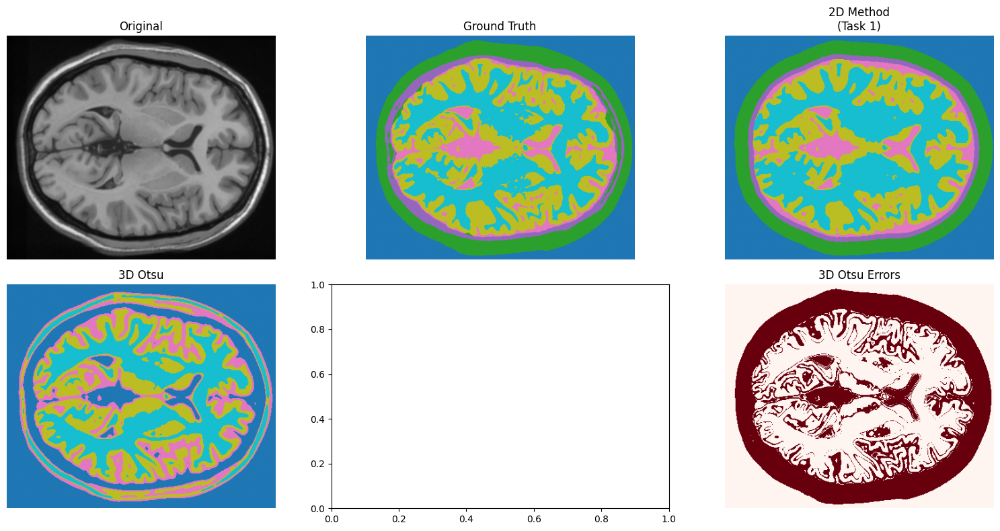

EVALUATION

EVALUATION RESULTS: 2D Baseline

Overall Pixel Accuracy: 0.9033 (90.33%)
Mean Dice Coefficient (tissues only): 0.8233
Mean Dice Coefficient (all classes): 0.8496
Mean IoU: 0.7156

Tissue Type          Dice Score      IoU Score      
--------------------------------------------------
Air                  0.9813          0.9632         
Skin                 0.8709          0.7713         
Skull                0.6042          0.4329         
CSF                  0.7980          0.6639         
Grey Matter          0.9093          0.8338         
White Matter         0.9340          0.8762         


EVALUATION RESULTS: 3D Otsu

Overall Pixel Accuracy: 0.6256 (62.56%)
Mean Dice Coefficient (tissues only): 0.3457
Mean Dice Coefficient (all classes): 0.4203
Mean IoU: 0.2685

Tissue Type          Dice Score      IoU Score      
--------------------------------------------------
Air                  0.7935          0.6578         
Skin                 0.0000          0.0000        

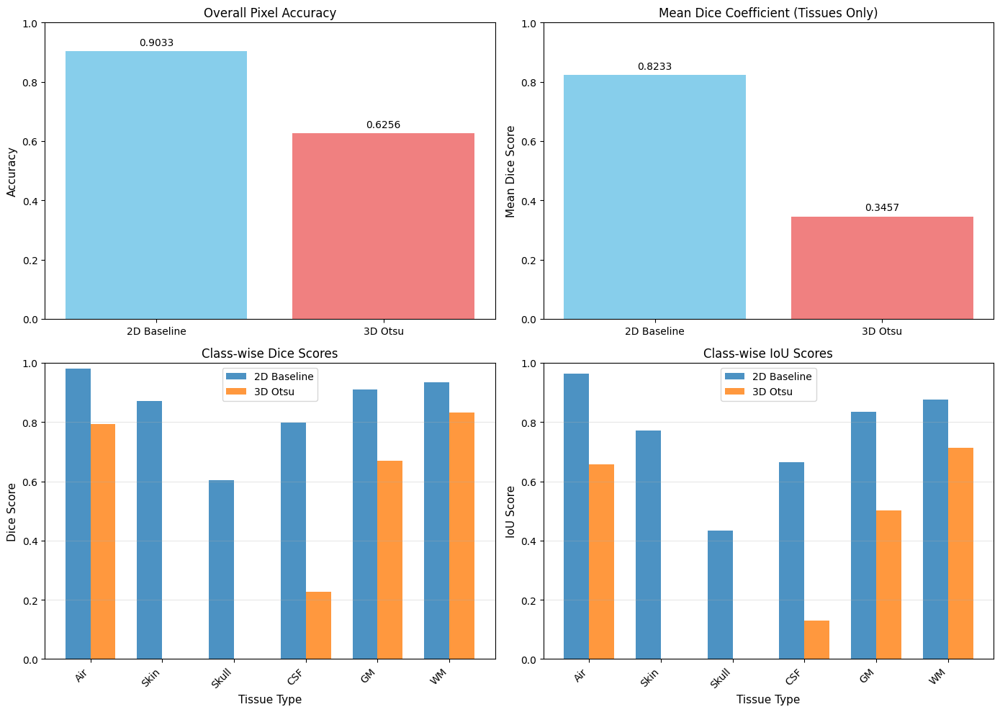

In [16]:
# Visualize all results
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
slice_idx = 1
axes[0, 0].imshow(T1[:, :, slice_idx], cmap='gray')
axes[0, 0].set_title('Original')
axes[0, 0].axis('off')
axes[0, 1].imshow(label[:, :, slice_idx], cmap='tab10', vmin=0, vmax=5)
axes[0, 1].set_title('Ground Truth')
axes[0, 1].axis('off')
# 2D baseline
result_2d = segment_otsu_iterative(T1[:, :, slice_idx])
axes[0, 2].imshow(result_2d, cmap='tab10', vmin=0, vmax=5)
axes[0, 2].set_title('2D Method\n(Task 1)')
axes[0, 2].axis('off')

axes[1, 0].imshow(segmented_3d[:, :, slice_idx], cmap='tab10', vmin=0, vmax=5)
axes[1, 0].set_title('3D Otsu')
axes[1, 0].axis('off')
# Errors
axes[1, 2].imshow(segmented_3d[:, :, slice_idx] != label[:, :, slice_idx], cmap='Reds')
axes[1, 2].set_title('3D Otsu Errors')
axes[1, 2].axis('off')
plt.tight_layout()
plt.show()
print("EVALUATION")

results_2d = np.zeros_like(label)
for z in range(T1.shape[2]):
    results_2d[:, :, z] = segment_otsu_iterative(T1[:, :, z])
eval_2d = evaluate_segmentation(results_2d, label, "2D Baseline")
eval_segmented = evaluate_segmentation(segmented_3d, label, "3D Otsu")
print_evaluation_results(eval_2d)
print_evaluation_results(eval_segmented)
plot_metrics_comparison([eval_2d,  eval_segmented])
